In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

FOLDERNAME = 'cse493g1/project'
PROJECT_PATH = f'/content/drive/MyDrive/{FOLDERNAME}'
%cd $PROJECT_PATH
%cd VLAD/
!pip install -r requirements.txt
!pip install pytorchvideo


Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/1OR_G1KW--WU6I4RMVItYt5BhiTf3RMiG/cse493g1/project
/content/drive/.shortcut-targets-by-id/1OR_G1KW--WU6I4RMVItYt5BhiTf3RMiG/cse493g1/project/VLAD
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.7/132.7 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.0/33.0 MB 50.6 MB/s eta 0:00:00
  Created wheel for pytorchvideo: filename=pytorchvideo-0.1.5-py3-none-any.whl size=188685 sha256=4ad665df30d87109cd7b75afa68741f1acade01190b234af5845c8081a6b4286
  Stored in directory: /root/.cache/pip/wheels/ff/4e/81/0f72a543be9ed7eb737c95bfc5da4025e73226b44368074ece
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any

In [ ]:
import os
import numpy as np
from transformers import CLIPProcessor, CLIPModel
import pytorchvideo.models.hub as models
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

import cv2
import utils
import vlad
import attack
import glob



In [ ]:
device = 'cuda'
ar_model = models.csn_r101(True)
ar_model = ar_model.eval().to(device)
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_model.eval().to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

label_names = None
with open('kinetics-labels.txt') as file:
    label_names = [line.rstrip() for line in file]


Downloading: "https://dl.fbaipublicfiles.com/pytorchvideo/model_zoo/kinetics/CSN_32x2_R101.pyth" to /root/.cache/torch/hub/checkpoints/CSN_32x2_R101.pyth
100%|██████████| 170M/170M [00:00<00:00, 228MB/s]
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
file_names_20 = ['ygLKayPwRZA.npy',
 'ygP1za_tmx4.npy',
 'yhZCJEr4x1w.npy',
 'yhg-IlXcVrE.npy',
 'yiIpsWdwxwk.npy',
 'yiMGw0v3RJs.npy',
 'yi_opsuyb8g.npy',
 'yimS7fmRQU8.npy',
 'yivjJkYiCLA.npy',
 'yj30goMPLIY.npy',
 'yj9OSripN-w.npy',
 'yjFF7sgHE-A.npy',
 'ykC62Wi0BFY.npy',
 'ykMqPdIjfxY.npy',
 'ykfWdDjL5UA.npy',
 'ykxPuwaOheM.npy',
 'ym1Eu_YVj4s.npy',
 'ym2ehgmrqlg.npy',
 'ysIr-YTnCN8.npy',
 'ysX2iraKsMQ.npy']

In [ ]:
print(label_names)

['abseiling', 'air drumming', 'answering questions', 'applauding', 'applying cream', 'archery', 'arm wrestling', 'arranging flowers', 'assembling computer', 'auctioning', 'baby waking up', 'baking cookies', 'balloon blowing', 'bandaging', 'barbequing', 'bartending', 'beatboxing', 'bee keeping', 'belly dancing', 'bench pressing', 'bending back', 'bending metal', 'biking through snow', 'blasting sand', 'blowing glass', 'blowing leaves', 'blowing nose', 'blowing out candles', 'bobsledding', 'bookbinding', 'bouncing on trampoline', 'bowling', 'braiding hair', 'breading or breadcrumbing', 'breakdancing', 'brush painting', 'brushing hair', 'brushing teeth', 'building cabinet', 'building shed', 'bungee jumping', 'busking', 'canoeing or kayaking', 'capoeira', 'carrying baby', 'cartwheeling', 'carving pumpkin', 'catching fish', 'catching or throwing baseball', 'catching or throwing frisbee', 'catching or throwing softball', 'celebrating', 'changing oil', 'changing wheel', 'checking tires', 'che

# Apply on Kinetics400 dataset

In [ ]:
scores_clean_kl = []
scores_attacked_kl = []
# scores_clean_chi = []
# scores_attacked_chi = []
scores_clean_hell = []
scores_attacked_hell = []
# scores_clean_bhat = []
# scores_attacked_bhat = []
# scores_clean_tvd = []
# scores_attacked_tvd = []

# video_name = 'yiMGw0v3RJs.npy'
# video = np.load('../npy_videos/{}'.format(video_name))
# video = utils.process_video(video)
npy_folder = '../npy_Kinetics400'
file_names = sorted(os.listdir(npy_folder))[:50]

In [ ]:
for video_name in file_names:
    if not video_name.endswith('.npy'):
        continue  # Skip non-npy files

    video_path = os.path.join(npy_folder, video_name)

    video = np.load(video_path)
    video = utils.process_video(video)

    with torch.no_grad():
        score_clean_kl = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='kl')
        # score_clean_chi = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='chi')
        score_clean_hell = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='hell')
        # score_clean_bhat = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='bhat')
        # score_clean_tvd = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='tvd')

    # Apply adversarial attack
    video = attack.pgd_attack(ar_model, video, eps=0.03)

    with torch.no_grad():
        score_attacked_kl = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='kl')
        # score_attacked_chi = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='chi')
        score_attacked_hell = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='hell')
        # score_attacked_bhat = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='bhat')
        # score_attacked_tvd = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='tvd')

    scores_clean_kl.append(score_clean_kl)
    scores_attacked_kl.append(score_attacked_kl)
    # scores_clean_chi.append(score_clean_chi)
    # scores_attacked_chi.append(score_attacked_chi)
    scores_clean_hell.append(score_clean_hell)
    scores_attacked_hell.append(score_attacked_hell)
    # scores_clean_bhat.append(score_clean_bhat)
    # scores_attacked_bhat.append(score_attacked_bhat)
    # scores_clean_tvd.append(score_clean_tvd)
    # scores_attacked_tvd.append(score_attacked_tvd)

    # Clear CUDA cache
    torch.cuda.empty_cache()


***************************
VLAD Score calculation
ar_model predicted label: tensor(221, device='cuda:0')
clip predictions: [('playing bass guitar', 0.8781443238258362), ('tapping guitar', 0.029905695468187332), ('cracking neck', 0.014979880303144455), ('recording music', 0.009319079108536243), ('playing guitar', 0.007633470930159092), ('strumming guitar', 0.0073317717760801315), ('playing cello', 0.0029145730659365654), ('finger snapping', 0.0028481578920036554), ('headbanging', 0.00210703001357615), ('air drumming', 0.002090201247483492), ('playing ukulele', 0.0018532734829932451), ('whistling', 0.0018397195963189006), ('playing saxophone', 0.001796254189684987), ('pumping fist', 0.0015705109108239412), ('digging', 0.0014856447232887149), ('bending back', 0.0013994083274155855), ('playing keyboard', 0.001344099990092218), ('playing trombone', 0.0012339360546320677), ('drumming fingers', 0.001144053996540606), ('playing harp', 0.0010671325726434588), ('blasting sand', 0.00102043268270

In [ ]:
sorted_scores = sorted(scores_clean_kl)

theta = 70  # Percentile
K = len(sorted_scores)
index = int((K * theta) / 100)

threshold = sorted_scores[index]
print(f"The threshold ({theta}th percentile) is: {threshold}")

The threshold (70th percentile) is: 5.423617362976074


In [ ]:
threshold = threshold.cpu().item() if isinstance(threshold, torch.Tensor) else threshold
scores_clean_kl = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_clean_kl]
scores_attacked_kl = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_attacked_kl]

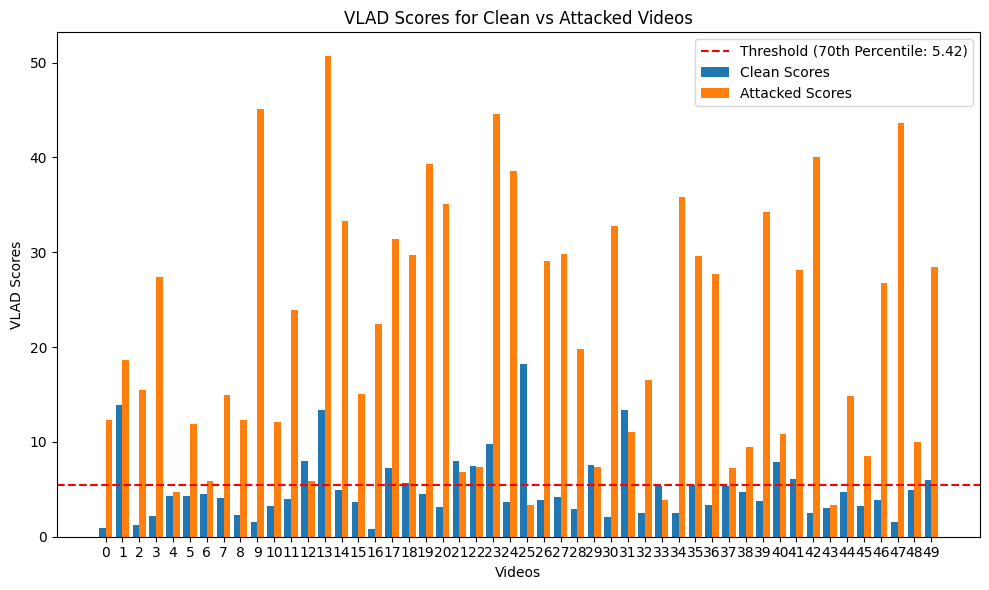

In [ ]:
x = np.arange(len(scores_clean_kl))
width = 0.4
video_names = list(range(1, 21))


fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width/2, scores_clean_kl, width, label='Clean Scores')
ax.bar(x + width/2, scores_attacked_kl, width, label='Attacked Scores')
ax.axhline(y=threshold, color='red', linestyle='--', label=f'Threshold ({theta}th Percentile: {threshold:.2f})')

# Adding labels and title
ax.set_xlabel('Videos')
ax.set_ylabel('VLAD Scores')
ax.set_title('VLAD Scores for Clean vs Attacked Videos')
ax.set_xticks(x)
# ax.set_xticklabels(video_names)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

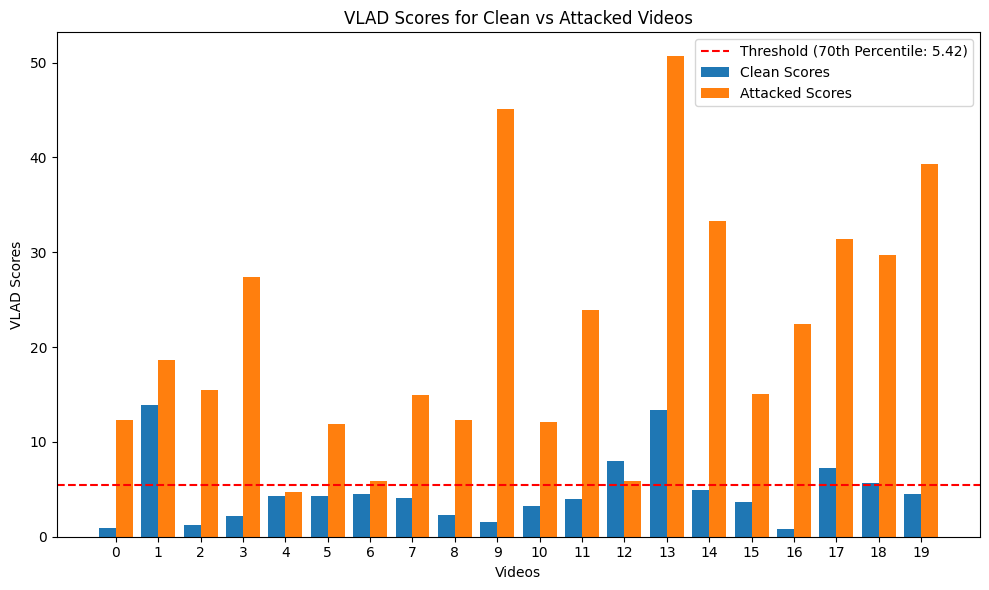

In [ ]:
x = np.arange(len(scores_clean_kl[:20]))
width = 0.4
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width/2, scores_clean_kl[:20], width, label='Clean Scores')
ax.bar(x + width/2, scores_attacked_kl[:20], width, label='Attacked Scores')
ax.axhline(y=threshold, color='red', linestyle='--', label=f'Threshold ({theta}th Percentile: {threshold:.2f})')

# Adding labels and title
ax.set_xlabel('Videos')
ax.set_ylabel('VLAD Scores')
ax.set_title('VLAD Scores for Clean vs Attacked Videos')
ax.set_xticks(x)
# ax.set_xticklabels(video_names)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

In [ ]:
sorted_scores_hell = sorted(scores_clean_hell)

theta = 70  # Percentile
K = len(sorted_scores_hell)
index = int((K * theta) / 100)

threshold_hell = sorted_scores_hell[index]
print(f"The threshold ({theta}th percentile) is: {threshold_hell}")

The threshold (70th percentile) is: 0.8557371260344703


In [ ]:
threshold_hell = threshold.cpu().item() if isinstance(threshold, torch.Tensor) else threshold
scores_clean_hell = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_clean_hell]
scores_attacked_hell = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_attacked_hell]

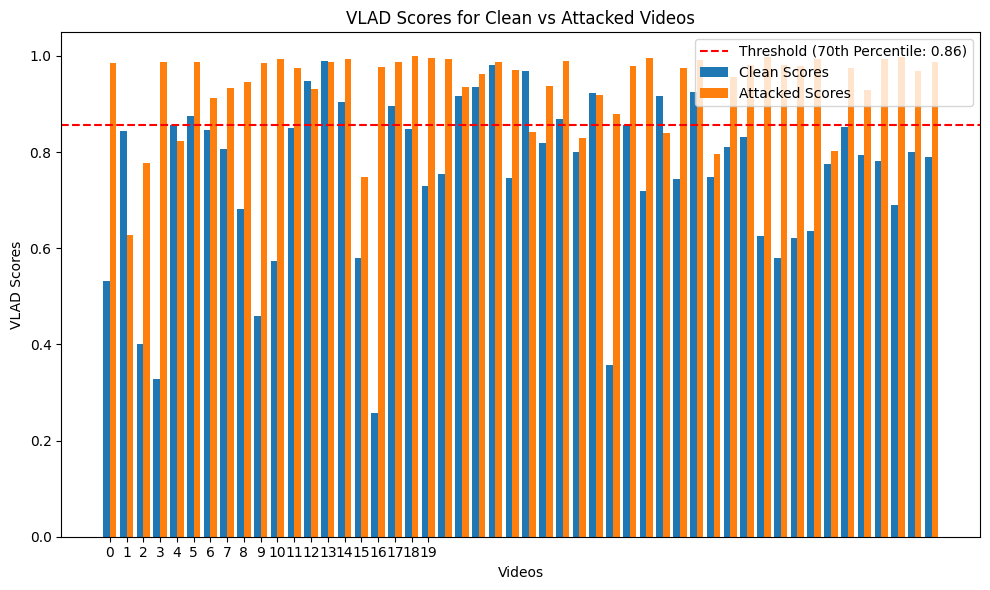

In [ ]:
x_hell = np.arange(len(scores_clean_hell))
width = 0.4
video_names = list(range(1, 21))


fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x_hell - width/2, scores_clean_hell, width, label='Clean Scores')
ax.bar(x_hell + width/2, scores_attacked_hell, width, label='Attacked Scores')
ax.axhline(y=threshold_hell, color='red', linestyle='--', label=f'Threshold ({theta}th Percentile: {threshold_hell:.2f})')

# Adding labels and title
ax.set_xlabel('Videos')
ax.set_ylabel('VLAD Scores')
ax.set_title('VLAD Scores for Clean vs Attacked Videos')
ax.set_xticks(x)
# ax.set_xticklabels(video_names)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

In [ ]:
print(file_names)

['ygLKayPwRZA.npy', 'ygP1za_tmx4.npy', 'yhZCJEr4x1w.npy', 'yhg-IlXcVrE.npy', 'yiIpsWdwxwk.npy', 'yiMGw0v3RJs.npy', 'yi_opsuyb8g.npy', 'yimS7fmRQU8.npy', 'yivjJkYiCLA.npy', 'yj30goMPLIY.npy', 'yj9OSripN-w.npy', 'yjFF7sgHE-A.npy', 'ykC62Wi0BFY.npy', 'ykMqPdIjfxY.npy', 'ykfWdDjL5UA.npy', 'ykxPuwaOheM.npy', 'ym1Eu_YVj4s.npy', 'ym2ehgmrqlg.npy', 'ysIr-YTnCN8.npy', 'ysX2iraKsMQ.npy', 'ysYxpwOvAzk.npy', 'yst56ERztUk.npy', 'yszYp04CCwE.npy', 'ytDQqVNcqrw.npy', 'ytGdUDHd4W8.npy', 'ytPsj2yOD54.npy', 'ytkKTAP2qPM.npy', 'ytnsBbsAZV4.npy', 'ytrcR7G8gYQ.npy', 'yu-0Iuz6nF0.npy', 'yuIdHtakhRU.npy', 'yxEGKC4YHes.npy', 'yxG9LiGMtRU.npy', 'yy9FJMvk_Io.npy', 'yyBD8B9mShY.npy', 'yykLATuO2pk.npy', 'yymr4YWVFe4.npy', 'yzN1L8WbsZY.npy', 'yzSRyYZfvBY.npy', 'yzdUyn3sHSs.npy', 'yziITbgU96M.npy', 'z-6l_dkR3vE.npy', 'z0UAPZBXmZA.npy', 'z1-U0uYFY3Q.npy', 'z1W6qW2fZGI.npy', 'z2IcCIRBrd8.npy', 'z2c0oW2kVNg.npy', 'z2d9Srt3QB0.npy', 'z2jhS6BOSRs.npy', 'z2jiyBe_GQ4.npy']


In [ ]:
print(scores_clean_kl)
print(scores_attacked_kl)

[0.923427402973175, 13.860522270202637, 1.227360486984253, 2.1397461891174316, 4.3270134925842285, 4.253300189971924, 4.510965824127197, 4.133880615234375, 2.3016579151153564, 1.5808086395263672, 3.2333195209503174, 3.9671990871429443, 8.000323295593262, 13.327689170837402, 4.970907688140869, 3.627828359603882, 0.8117560148239136, 7.2759108543396, 5.6449480056762695, 4.508944988250732, 3.1458897590637207, 8.016968727111816, 7.484065532684326, 9.777212142944336, 3.627599000930786, 18.179224014282227, 3.8848671913146973, 4.230227470397949, 2.8854780197143555, 7.615677833557129, 2.095243215560913, 13.394735336303711, 2.5405116081237793, 5.3049211502075195, 2.5061168670654297, 5.423617362976074, 3.3529951572418213, 5.301601886749268, 4.722623348236084, 3.7374229431152344, 7.895101070404053, 6.122528076171875, 2.530315399169922, 3.0000803470611572, 4.67142915725708, 3.2020552158355713, 3.9113874435424805, 1.5080469846725464, 4.896160125732422, 5.952843189239502]
[12.349952697753906, 18.6266

In [ ]:
print(scores_clean_hell)
print(scores_attacked_hell)

[0.5325552729901029, 0.8444051372918459, 0.4011823940955256, 0.32723087901833087, 0.8569689548755419, 0.8744945689543889, 0.8453260403418098, 0.8070336024861146, 0.6819812105278225, 0.45943342488624933, 0.5734820464539083, 0.8505534734914121, 0.9469471755379332, 0.9902006510179308, 0.9036683225380875, 0.5787520329178191, 0.2569349252331275, 0.8961371076137273, 0.8470005718782527, 0.7299611835615464, 0.7544127044517588, 0.9169425670708606, 0.9352993463352327, 0.9816560997546535, 0.746465473311966, 0.9693380398917536, 0.8191445173799878, 0.8697186839546936, 0.7998639977604983, 0.9230691356936254, 0.3564809807071862, 0.8557371260344703, 0.7199079264692482, 0.9167579052363812, 0.7434079273152648, 0.9254377736475705, 0.7482464537513849, 0.8109938282106409, 0.8320229919297808, 0.6251048600014749, 0.5798895608130588, 0.6212985380569397, 0.6358842759540985, 0.7748636518676342, 0.852852585534949, 0.7944419594263699, 0.7804104109038573, 0.6907450214252341, 0.8007737707636312, 0.7896478999461558]

In [ ]:
for (i, video_name) in enumerate(file_names):
  print('=================')
  print('VLAD Scores (KL) for {} -> clean: {}, attacked: {}'.format(video_name, scores_clean_kl[i], scores_attacked_kl[i]))
  print('*****************')
  print('VLAD Scores (Hell) for {} -> clean: {}, attacked: {}'.format(video_name, scores_clean_hell[i], scores_attacked_hell[i]))
  print('=================')


VLAD Scores (KL) for ygLKayPwRZA.npy -> clean: 0.923427402973175, attacked: 12.349952697753906
*****************
VLAD Scores (Hell) for ygLKayPwRZA.npy -> clean: 0.5325552729901029, attacked: 0.984295683465623
VLAD Scores (KL) for ygP1za_tmx4.npy -> clean: 13.860522270202637, attacked: 18.626646041870117
*****************
VLAD Scores (Hell) for ygP1za_tmx4.npy -> clean: 0.8444051372918459, attacked: 0.6276212217484737
VLAD Scores (KL) for yhZCJEr4x1w.npy -> clean: 1.227360486984253, attacked: 15.497566223144531
*****************
VLAD Scores (Hell) for yhZCJEr4x1w.npy -> clean: 0.4011823940955256, attacked: 0.7779824704467065
VLAD Scores (KL) for yhg-IlXcVrE.npy -> clean: 2.1397461891174316, attacked: 27.385683059692383
*****************
VLAD Scores (Hell) for yhg-IlXcVrE.npy -> clean: 0.32723087901833087, attacked: 0.9871565635804093
VLAD Scores (KL) for yiIpsWdwxwk.npy -> clean: 4.3270134925842285, attacked: 4.672306060791016
*****************
VLAD Scores (Hell) for yiIpsWdwxwk.npy ->

In [ ]:
for video_name in file_names_20:
    if not video_name.endswith('.npy'):
        continue  # Skip non-npy files

    video_path = os.path.join(npy_folder, video_name)

    video = np.load(video_path)
    video = utils.process_video(video)

    with torch.no_grad():
        score_clean_kl = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='kl')
        # score_clean_chi = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='chi')
        score_clean_hell = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='hell')
        # score_clean_bhat = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='bhat')
        # score_clean_tvd = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='tvd')

    # Apply adversarial attack
    video = attack.pgd_attack(ar_model, video, eps=0.03)

    with torch.no_grad():
        score_attacked_kl = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='kl')
        # score_attacked_chi = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='chi')
        score_attacked_hell = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='hell')
        # score_attacked_bhat = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='bhat')
        # score_attacked_tvd = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='tvd')

    scores_clean_kl.append(score_clean_kl)
    scores_attacked_kl.append(score_attacked_kl)
    # scores_clean_chi.append(score_clean_chi)
    # scores_attacked_chi.append(score_attacked_chi)
    scores_clean_hell.append(score_clean_hell)
    scores_attacked_hell.append(score_attacked_hell)
    # scores_clean_bhat.append(score_clean_bhat)
    # scores_attacked_bhat.append(score_attacked_bhat)
    # scores_clean_tvd.append(score_clean_tvd)
    # scores_attacked_tvd.append(score_attacked_tvd)

    # Clear CUDA cache
    torch.cuda.empty_cache()


***************************
VLAD Score calculation
ar_model predicted label: tensor(221, device='cuda:0')
clip predictions: [('playing bass guitar', 0.8781443238258362), ('tapping guitar', 0.029905695468187332), ('cracking neck', 0.014979880303144455), ('recording music', 0.009319079108536243), ('playing guitar', 0.007633470930159092), ('strumming guitar', 0.0073317717760801315), ('playing cello', 0.0029145730659365654), ('finger snapping', 0.0028481578920036554), ('headbanging', 0.00210703001357615), ('air drumming', 0.002090201247483492), ('playing ukulele', 0.0018532734829932451), ('whistling', 0.0018397195963189006), ('playing saxophone', 0.001796254189684987), ('pumping fist', 0.0015705109108239412), ('digging', 0.0014856447232887149), ('bending back', 0.0013994083274155855), ('playing keyboard', 0.001344099990092218), ('playing trombone', 0.0012339360546320677), ('drumming fingers', 0.001144053996540606), ('playing harp', 0.0010671325726434588), ('blasting sand', 0.00102043268270

In [ ]:
scores_clean_kl = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_clean_kl]
scores_attacked_kl = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_attacked_kl]

y_score = np.concatenate([scores_clean_kl, scores_attacked_kl])

y_true = np.concatenate([np.zeros(len(scores_clean_kl)), np.ones(len(scores_attacked_kl))])

auc_score = roc_auc_score(y_true, y_score)

print("ROC AUC Score(KL):", auc_score)

ROC AUC Score(KL): 0.9525000000000001


In [ ]:
scores_clean_hell = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_clean_hell]
scores_attacked_hell = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_attacked_hell]

y_score = np.concatenate([scores_clean_hell, scores_attacked_hell])

y_true = np.concatenate([np.zeros(len(scores_clean_hell)), np.ones(len(scores_attacked_hell))])

auc_score = roc_auc_score(y_true, y_score)

print("ROC AUC Score(HELL):", auc_score)

ROC AUC Score(HELL): 0.9


# Apply on UCF101 dataset

In [ ]:
scores_clean_kl_ucf = []
scores_attacked_kl_ucf = []
# scores_clean_chi = []
# scores_attacked_chi = []
scores_clean_hell_ucf = []
scores_attacked_hell_ucf = []
# scores_clean_bhat = []
# scores_attacked_bhat = []
# scores_clean_tvd = []
# scores_attacked_tvd = []


npy_folder = '../npy_UCF101'
file_names = sorted(os.listdir(npy_folder))[:50]

for video_name in file_names:
    if not video_name.endswith('.npy'):
        continue

    video_path = os.path.join(npy_folder, video_name)

    video = np.load(video_path)
    video = utils.process_video(video)

    with torch.no_grad():
        score_clean_kl = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='kl')
        score_clean_hell = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='hell')

    video = attack.pgd_attack(ar_model, video, eps=0.03)

    with torch.no_grad():
        score_attacked_kl = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='kl')
        score_attacked_hell = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='hell')


    scores_clean_kl_ucf.append(score_clean_kl)
    scores_attacked_kl_ucf.append(score_attacked_kl)
    scores_clean_hell_ucf.append(score_clean_hell)
    scores_attacked_hell_ucf.append(score_attacked_hell)
    torch.cuda.empty_cache()


***************************
VLAD Score calculation
ar_model predicted label: tensor(4, device='cuda:0')
clip predictions: [('filling eyebrows', 0.18874342739582062), ('waxing eyebrows', 0.07934112101793289), ('blowing nose', 0.07361307740211487), ('applying cream', 0.06569033861160278), ('applauding', 0.06206117570400238), ('sneezing', 0.04304686188697815), ('doing nails', 0.01863286830484867), ('playing harmonica', 0.0178331658244133), ('beatboxing', 0.01754327490925789), ('faceplanting', 0.017401838675141335), ('sign language interpreting', 0.015813753008842468), ('finger snapping', 0.015408768318593502), ('peeling potatoes', 0.014324854128062725), ('cutting nails', 0.012818796560168266), ('baby waking up', 0.01170901395380497), ('sniffing', 0.01147940382361412), ('clapping', 0.009789276868104935), ('texting', 0.00925753079354763), ('dying hair', 0.007663431577384472), ("massaging person's head", 0.007485703565180302), ('massaging back', 0.006841296795755625), ('fixing hair', 0.00662

In [ ]:
sorted_scores = sorted(scores_clean_kl_ucf)

theta = 70  # Percentile
K = len(sorted_scores)
index = int((K * theta) / 100)

threshold_kl = sorted_scores[index]
print(f"The threshold ({theta}th percentile) is: {threshold_kl}")

The threshold (70th percentile) is: 6.115691184997559


In [ ]:
sorted_scores = sorted(scores_clean_hell_ucf)

theta = 70  # Percentile
K = len(sorted_scores)
index = int((K * theta) / 100)

threshold_hell = sorted_scores[index]
print(f"The threshold ({theta}th percentile) is: {threshold_hell}")

The threshold (70th percentile) is: 0.8510962710028781


In [ ]:
threshold_kl = threshold.cpu().item() if isinstance(threshold_kl, torch.Tensor) else threshold_kl
threshold_hell = threshold.cpu().item() if isinstance(threshold_hell, torch.Tensor) else threshold_hell
scores_clean_kl_ucf = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_clean_kl_ucf]
scores_attacked_kl_ucf = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_attacked_kl_ucf]

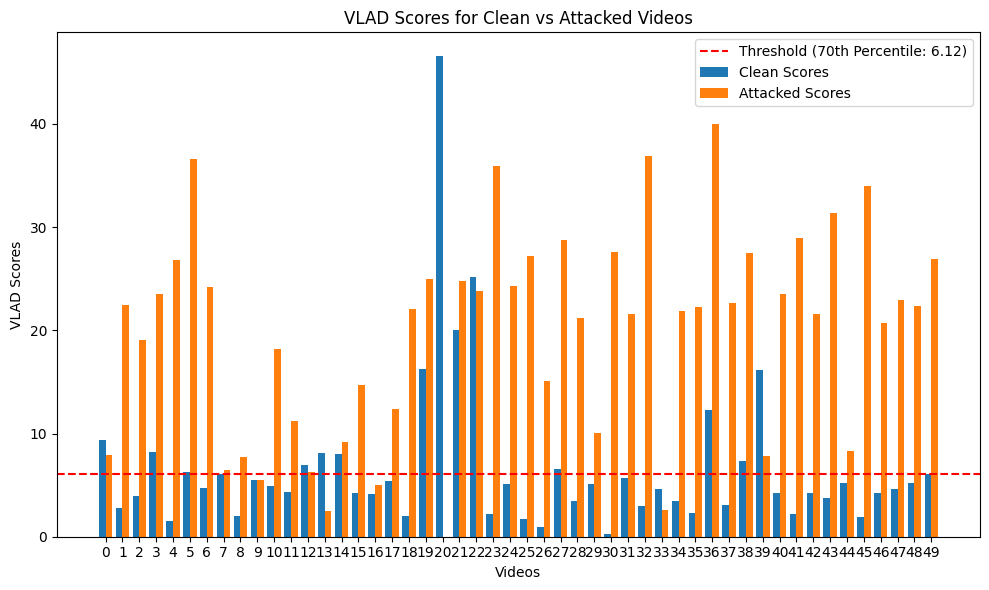

In [ ]:
x = np.arange(len(scores_clean_kl_ucf))
width = 0.4
video_names = list(range(1, 21))


fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width/2, scores_clean_kl_ucf, width, label='Clean Scores')
ax.bar(x + width/2, scores_attacked_kl_ucf, width, label='Attacked Scores')
ax.axhline(y=threshold_kl, color='red', linestyle='--', label=f'Threshold ({theta}th Percentile: {threshold_kl:.2f})')

# Adding labels and title
ax.set_xlabel('Videos')
ax.set_ylabel('VLAD Scores')
ax.set_title('VLAD Scores for Clean vs Attacked Videos')
ax.set_xticks(x)
# ax.set_xticklabels(video_names)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

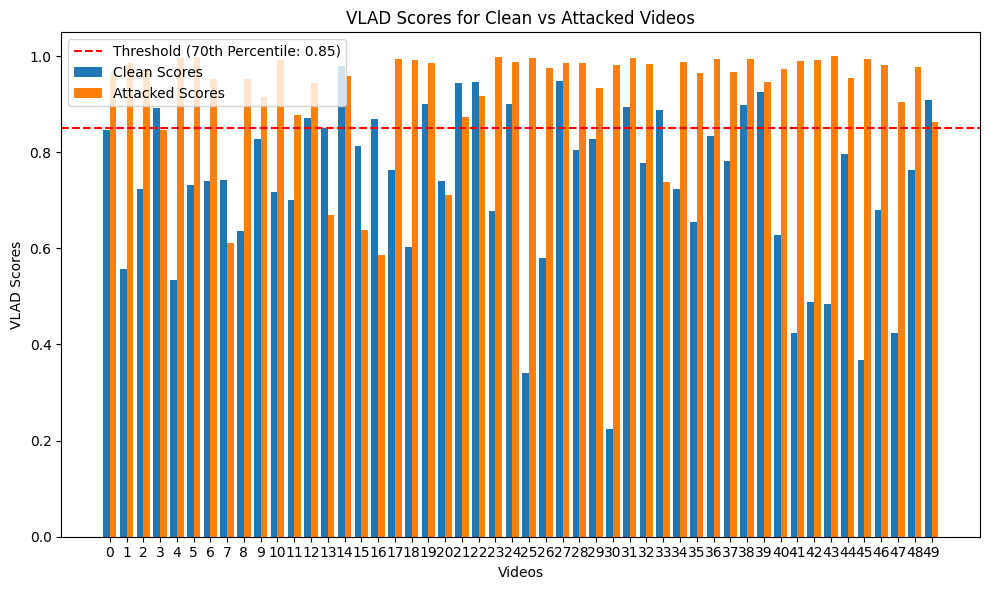

In [ ]:
x = np.arange(len(scores_clean_hell_ucf))
width = 0.4
video_names = list(range(1, 21))


fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width/2, scores_clean_hell_ucf, width, label='Clean Scores')
ax.bar(x + width/2, scores_attacked_hell_ucf, width, label='Attacked Scores')
ax.axhline(y=threshold_hell, color='red', linestyle='--', label=f'Threshold ({theta}th Percentile: {threshold_hell:.2f})')

# Adding labels and title
ax.set_xlabel('Videos')
ax.set_ylabel('VLAD Scores')
ax.set_title('VLAD Scores for Clean vs Attacked Videos')
ax.set_xticks(x)
# ax.set_xticklabels(video_names)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

# Switch to MVIT ar-model

In [ ]:
from pytorchvideo.models.hub import mvit_base_16x4


mvit = mvit_base_16x4(pretrained=True)
mvit = mvit.eval().to(device)


In [ ]:
print(mvit)


MViT(
  (conv_proj): Conv3d(3, 96, kernel_size=(3, 7, 7), stride=(2, 4, 4), padding=(1, 3, 3))
  (pos_encoding): PositionalEncoding()
  (blocks): ModuleList(
    (0): MultiscaleBlock(
      (norm1): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
      (norm2): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
      (attn): MultiscaleAttention(
        (qkv): Linear(in_features=96, out_features=288, bias=True)
        (project): Sequential(
          (0): Linear(in_features=96, out_features=96, bias=True)
        )
        (pool_k): Pool(
          (pool): Conv3d(96, 96, kernel_size=(3, 3, 3), stride=(1, 8, 8), padding=(1, 1, 1), groups=96, bias=False)
          (norm_act): Sequential(
            (0): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
          )
        )
        (pool_v): Pool(
          (pool): Conv3d(96, 96, kernel_size=(3, 3, 3), stride=(1, 8, 8), padding=(1, 1, 1), groups=96, bias=False)
          (norm_act): Sequential(
            (0): LayerNorm((96,

In [ ]:
scores_clean_kl_mvit = []
scores_attacked_kl_mvit = []
# scores_clean_chi = []
# scores_attacked_chi = []
scores_clean_hell_mvit = []
scores_attacked_hell_mvit = []
# scores_clean_bhat = []
# scores_attacked_bhat = []
# scores_clean_tvd = []
# scores_attacked_tvd = []

npy_folder = '../npy_Kinetics400'
file_names = sorted(os.listdir(npy_folder))[:50]

In [ ]:
for video_name in file_names_20:
    if not video_name.endswith('.npy'):
        continue  # Skip non-npy files

    video_path = os.path.join(npy_folder, video_name)

    video = np.load(video_path)
    video = utils.process_video(video)
    video = video[:, :, ::2, :, :]

    with torch.no_grad():
        score_clean_kl = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='kl')
        # score_clean_chi = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='chi')
        score_clean_hell = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='hell')
        # score_clean_bhat = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='bhat')
        # score_clean_tvd = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='tvd')

    # Apply adversarial attack
    video = attack.pgd_attack(mvit, video, eps=0.03)

    with torch.no_grad():
        score_attacked_kl = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='kl')
        # score_attacked_chi = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='chi')
        score_attacked_hell = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='hell')
        # score_attacked_bhat = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='bhat')
        # score_attacked_tvd = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='tvd')

    scores_clean_kl_mvit.append(score_clean_kl)
    scores_attacked_kl_mvit.append(score_attacked_kl)
    # scores_clean_chi.append(score_clean_chi)
    # scores_attacked_chi.append(score_attacked_chi)
    scores_clean_hell_mvit.append(score_clean_hell)
    scores_attacked_hell_mvit.append(score_attacked_hell)
    # scores_clean_bhat.append(score_clean_bhat)
    # scores_attacked_bhat.append(score_attacked_bhat)
    # scores_clean_tvd.append(score_clean_tvd)
    # scores_attacked_tvd.append(score_attacked_tvd)

    # Clear CUDA cache
    torch.cuda.empty_cache()


NameError: name 'file_names_20' is not defined

In [ ]:
scores_clean_kl_mvit = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_clean_kl_mvit]
scores_attacked_kl_mvit = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_attacked_kl_mvit]

In [ ]:
import numpy as np
from sklearn.metrics import roc_auc_score

y_score = np.concatenate([scores_clean_kl_mvit, scores_attacked_kl_mvit])

y_true = np.concatenate([np.zeros(len(scores_clean_kl_mvit)), np.ones(len(scores_attacked_kl_mvit))])

auc_score = roc_auc_score(y_true, y_score)

print("ROC AUC Score:", auc_score)


ROC AUC Score: 0.8176284392500609


In [ ]:
y_score = np.concatenate([scores_clean_hell_mvit, scores_attacked_hell_mvit])

y_true = np.concatenate([np.zeros(len(scores_clean_hell_mvit)), np.ones(len(scores_attacked_hell_mvit))])

auc_score = roc_auc_score(y_true, y_score)

print("ROC AUC Score(HELL):", auc_score)

ROC AUC Score(HELL): 0.8000162324486648


In [ ]:
npy_folder_att = '../kinetics_attacked'
file_names = sorted(os.listdir(npy_folder_att))

In [ ]:
for idx, video_name in enumerate(file_names_20):
    if not video_name.endswith('.npy'):
        continue  # Skip non-npy files

    video_name_att = f'video_{idx+1}.npy'
    video_path = os.path.join(npy_folder, video_name)
    video_path_att = os.path.join(npy_folder_att, video_name_att)

    video = np.load(video_path)
    video = utils.process_video(video)
    video = video[:, :, ::2, :, :]

    video_att = np.load(video_path_att)
    video_att = torch.from_numpy(video_att)
    video_att = video_att.unsqueeze(0)
    video_att = video_att.to('cuda')
    video_att = video_att[:, :, ::2, :, :]

    with torch.no_grad():
        score_clean_kl = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='kl')
        score_clean_hell = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='hell')


    print(video_att.shape)
    with torch.no_grad():
        score_attacked_kl = vlad.vlad_score(video_att, mvit, clip_model, clip_processor, label_names, distance_metric='kl')
        score_attacked_hell = vlad.vlad_score(video_att, mvit, clip_model, clip_processor, label_names, distance_metric='hell')


    scores_clean_kl_mvit.append(score_clean_kl)
    scores_attacked_kl_mvit.append(score_attacked_kl)

    scores_clean_hell_mvit.append(score_clean_hell)
    scores_attacked_hell_mvit.append(score_attacked_hell)

    # Clear CUDA cache
    torch.cuda.empty_cache()


***************************
VLAD Score calculation
ar_model predicted label: tensor(221, device='cuda:0')
clip predictions: [('playing bass guitar', 0.8647509813308716), ('tapping guitar', 0.033486880362033844), ('cracking neck', 0.017373649403452873), ('recording music', 0.009479186497628689), ('strumming guitar', 0.008483420126140118), ('playing guitar', 0.008317490108311176), ('finger snapping', 0.0032529409509152174), ('playing cello', 0.003039864357560873), ('air drumming', 0.002209288766607642), ('headbanging', 0.002131818328052759), ('whistling', 0.0020073784980922937), ('playing ukulele', 0.0020059002563357353), ('playing saxophone', 0.001958976499736309), ('pumping fist', 0.001673943712376058), ('digging', 0.0016362385358661413), ('bending back', 0.0014564822195097804), ('playing keyboard', 0.0014395781327039003), ('playing trombone', 0.0013943705707788467), ('drumming fingers', 0.0012465865584090352), ('blasting sand', 0.0011914123315364122), ('playing harp', 0.00109524209983

In [ ]:
scores_clean_kl_mvit = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_clean_kl_mvit]
scores_attacked_kl_mvit = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_attacked_kl_mvit]

y_score = np.concatenate([scores_clean_kl_mvit, scores_attacked_kl_mvit])

y_true = np.concatenate([np.zeros(len(scores_clean_kl_mvit)), np.ones(len(scores_attacked_kl_mvit))])

auc_score = roc_auc_score(y_true, y_score)

print("ROC AUC Score(KL):", auc_score)

ROC AUC Score(KL): 0.7788888888888889


In [ ]:
y_score = np.concatenate([scores_clean_hell_mvit, scores_attacked_hell_mvit])

y_true = np.concatenate([np.zeros(len(scores_clean_hell_mvit)), np.ones(len(scores_attacked_hell_mvit))])

auc_score = roc_auc_score(y_true, y_score)

print("ROC AUC Score(HELL):", auc_score)

ROC AUC Score(HELL): 0.7692592592592593


In [ ]:
for video_name in file_names:
    if not video_name.endswith('.npy'):
        continue  # Skip non-npy files

    video_path = os.path.join(npy_folder, video_name)

    video = np.load(video_path)
    video = utils.process_video(video)
    video = video[:, :, ::2, :, :]

    with torch.no_grad():
        score_clean_kl = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='kl')
        # score_clean_chi = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='chi')
        score_clean_hell = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='hell')
        # score_clean_bhat = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='bhat')
        # score_clean_tvd = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='tvd')

    # Apply adversarial attack
    video = attack.pgd_attack(mvit, video, eps=0.03)

    with torch.no_grad():
        score_attacked_kl = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='kl')
        # score_attacked_chi = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='chi')
        score_attacked_hell = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='hell')
        # score_attacked_bhat = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='bhat')
        # score_attacked_tvd = vlad.vlad_score(video, mvit, clip_model, clip_processor, label_names, distance_metric='tvd')

    scores_clean_kl_mvit.append(score_clean_kl)
    scores_attacked_kl_mvit.append(score_attacked_kl)
    # scores_clean_chi.append(score_clean_chi)
    # scores_attacked_chi.append(score_attacked_chi)
    scores_clean_hell_mvit.append(score_clean_hell)
    scores_attacked_hell_mvit.append(score_attacked_hell)
    # scores_clean_bhat.append(score_clean_bhat)
    # scores_attacked_bhat.append(score_attacked_bhat)
    # scores_clean_tvd.append(score_clean_tvd)
    # scores_attacked_tvd.append(score_attacked_tvd)

    # Clear CUDA cache
    torch.cuda.empty_cache()


***************************
VLAD Score calculation
ar_model predicted label: tensor(221, device='cuda:0')
clip predictions: [('playing bass guitar', 0.8647509813308716), ('tapping guitar', 0.033486880362033844), ('cracking neck', 0.017373649403452873), ('recording music', 0.009479186497628689), ('strumming guitar', 0.008483420126140118), ('playing guitar', 0.008317490108311176), ('finger snapping', 0.0032529409509152174), ('playing cello', 0.003039864357560873), ('air drumming', 0.002209288766607642), ('headbanging', 0.002131818328052759), ('whistling', 0.0020073784980922937), ('playing ukulele', 0.0020059002563357353), ('playing saxophone', 0.001958976499736309), ('pumping fist', 0.001673943712376058), ('digging', 0.0016362385358661413), ('bending back', 0.0014564822195097804), ('playing keyboard', 0.0014395781327039003), ('playing trombone', 0.0013943705707788467), ('drumming fingers', 0.0012465865584090352), ('blasting sand', 0.0011914123315364122), ('playing harp', 0.00109524209983

In [ ]:
sorted_scores = sorted(scores_clean_kl_mvit)

theta = 70  # Percentile
K = len(sorted_scores)
index = int((K * theta) / 100)

threshold = sorted_scores[index]
print(f"The threshold ({theta}th percentile) is: {threshold}")

The threshold (70th percentile) is: 2.074075937271118


In [ ]:
threshold = threshold.cpu().item() if isinstance(threshold, torch.Tensor) else threshold
scores_clean_kl_mvit = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_clean_kl_mvit]
scores_attacked_kl_mvit = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_attacked_kl_mvit]


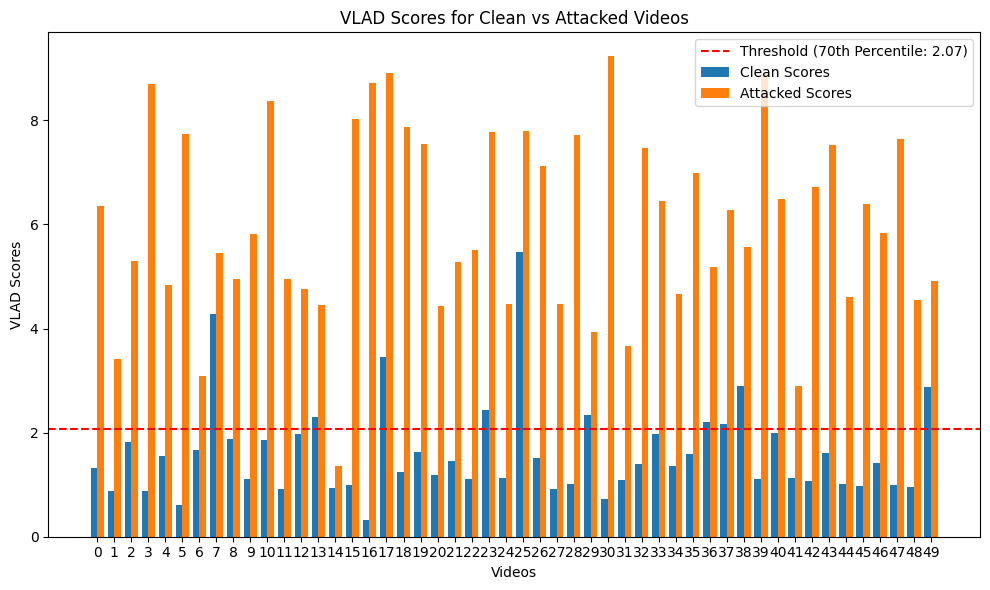

In [ ]:
x = np.arange(len(scores_clean_kl_mvit))
width = 0.4
video_names = list(range(1, 21))


fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width/2, scores_clean_kl_mvit, width, label='Clean Scores')
ax.bar(x + width/2, scores_attacked_kl_mvit, width, label='Attacked Scores')
ax.axhline(y=threshold, color='red', linestyle='--', label=f'Threshold ({theta}th Percentile: {threshold:.2f})')

# Adding labels and title
ax.set_xlabel('Videos')
ax.set_ylabel('VLAD Scores')
ax.set_title('VLAD Scores for Clean vs Attacked Videos')
ax.set_xticks(x)
# ax.set_xticklabels(video_names)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()


In [ ]:
print(scores_clean_kl_mvit)
print(scores_attacked_kl_mvit)
print(scores_clean_hell_mvit)
print(scores_attacked_hell_mvit)

[1.3131316900253296, 0.8718666434288025, 1.8250908851623535, 0.8742877244949341, 1.5494760274887085, 0.617680549621582, 1.6649402379989624, 4.280062675476074, 1.8703019618988037, 1.0999274253845215, 1.850938320159912, 0.9087563753128052, 1.9715702533721924, 2.297434091567993, 0.9382240176200867, 0.9875832796096802, 0.3297620117664337, 3.4531774520874023, 1.2466700077056885, 1.6193426847457886, 1.194788932800293, 1.4521619081497192, 1.1143622398376465, 2.430880308151245, 1.136405110359192, 5.470177173614502, 1.503448486328125, 0.9237416386604309, 1.009205937385559, 2.3301873207092285, 0.7190343737602234, 1.0894066095352173, 1.40571129322052, 1.9704136848449707, 1.365079402923584, 1.5881787538528442, 2.199903726577759, 2.159090995788574, 2.896125555038452, 1.1098074913024902, 1.98540461063385, 1.131359577178955, 1.073272466659546, 1.6087126731872559, 1.0157781839370728, 0.9735921621322632, 1.4097834825515747, 0.9899851083755493, 0.9489283561706543, 2.869105815887451]
[6.351337432861328, 

# MViT + UCF100

In [ ]:
scores_clean_kl_mvit_ucf = []
scores_attacked_kl_mvit_ucf = []

scores_clean_hell_mvit_ucf = []
scores_attacked_hell_mvit_ucf = []



npy_folder = '../npy_UCF101'
file_names = sorted(os.listdir(npy_folder))[:50]

In [ ]:
for video_name in file_names:
    if not video_name.endswith('.npy'):
        continue

    video_path = os.path.join(npy_folder, video_name)

    video = np.load(video_path)
    video = utils.process_video(video)

    with torch.no_grad():
        score_clean_kl = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='kl')
        score_clean_hell = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='hell')

    video = attack.pgd_attack(ar_model, video, eps=0.03)

    with torch.no_grad():
        score_attacked_kl = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='kl')
        score_attacked_hell = vlad.vlad_score(video, ar_model, clip_model, clip_processor, label_names, distance_metric='hell')


    scores_clean_kl_mvit_ucf.append(score_clean_kl)
    scores_attacked_kl_mvit_ucf.append(score_attacked_kl)
    scores_clean_hell_mvit_ucf.append(score_clean_hell)
    scores_attacked_hell_mvit_ucf.append(score_attacked_hell)
    torch.cuda.empty_cache()


***************************
VLAD Score calculation
ar_model predicted label: tensor(4, device='cuda:0')
clip predictions: [('filling eyebrows', 0.18874342739582062), ('waxing eyebrows', 0.07934112101793289), ('blowing nose', 0.07361307740211487), ('applying cream', 0.06569033861160278), ('applauding', 0.06206117570400238), ('sneezing', 0.04304686188697815), ('doing nails', 0.01863286830484867), ('playing harmonica', 0.0178331658244133), ('beatboxing', 0.01754327490925789), ('faceplanting', 0.017401838675141335), ('sign language interpreting', 0.015813753008842468), ('finger snapping', 0.015408768318593502), ('peeling potatoes', 0.014324854128062725), ('cutting nails', 0.012818796560168266), ('baby waking up', 0.01170901395380497), ('sniffing', 0.01147940382361412), ('clapping', 0.009789276868104935), ('texting', 0.00925753079354763), ('dying hair', 0.007663431577384472), ("massaging person's head", 0.007485703565180302), ('massaging back', 0.006841296795755625), ('fixing hair', 0.00662

In [ ]:
sorted_scores = sorted(scores_clean_kl_mvit_ucf)

theta = 70  # Percentile
K = len(sorted_scores)
index = int((K * theta) / 100)

threshold_kl = sorted_scores[index]
print(f"The threshold ({theta}th percentile) is: {threshold_kl}")

The threshold (70th percentile) is: 6.115691184997559


In [ ]:
sorted_scores = sorted(scores_clean_hell_mvit_ucf)

theta = 70  # Percentile
K = len(sorted_scores)
index = int((K * theta) / 100)

threshold_hell = sorted_scores[index]
print(f"The threshold ({theta}th percentile) is: {threshold_hell}")

The threshold (70th percentile) is: 0.8510962710028781


In [ ]:
threshold_kl = threshold.cpu().item() if isinstance(threshold_kl, torch.Tensor) else threshold_kl
threshold_hell = threshold.cpu().item() if isinstance(threshold_hell, torch.Tensor) else threshold_hell
scores_clean_kl_mvit_ucf = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_clean_kl_mvit_ucf]
scores_attacked_kl_mvit_ucf = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_attacked_kl_mvit_ucf]
scores_clean_hell_mvit_ucf = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_clean_hell_mvit_ucf]
scores_attacked_hell_mvit_ucf = [score.cpu().item() if isinstance(score, torch.Tensor) else score for score in scores_attacked_hell_mvit_ucf]

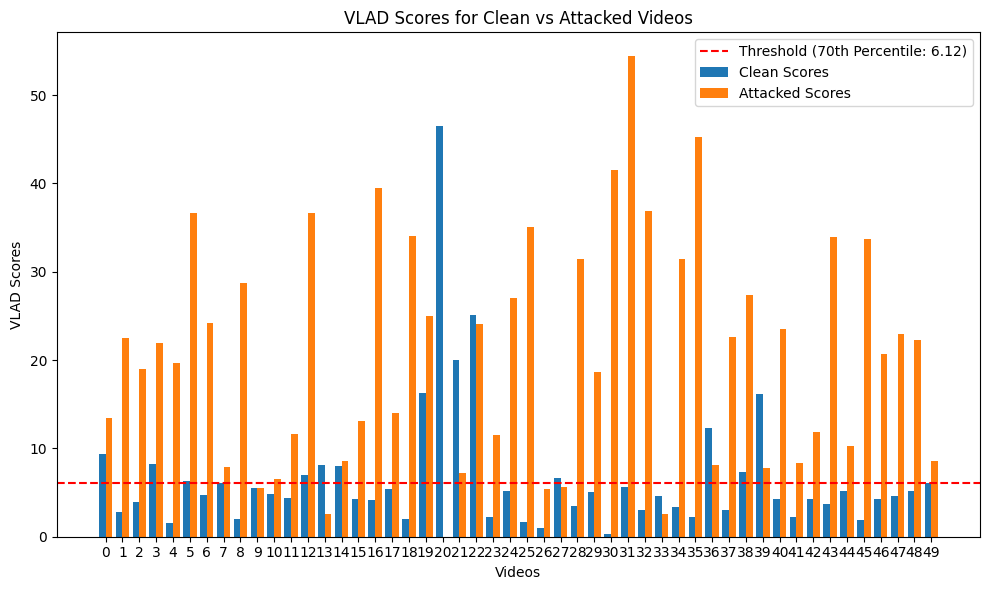

In [ ]:
x = np.arange(len(scores_clean_kl_mvit_ucf))
width = 0.4
video_names = list(range(1, 21))


fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width/2, scores_clean_kl_mvit_ucf, width, label='Clean Scores')
ax.bar(x + width/2, scores_attacked_kl_mvit_ucf, width, label='Attacked Scores')
ax.axhline(y=threshold_kl, color='red', linestyle='--', label=f'Threshold ({theta}th Percentile: {threshold_kl:.2f})')

# Adding labels and title
ax.set_xlabel('Videos')
ax.set_ylabel('VLAD Scores')
ax.set_title('VLAD Scores for Clean vs Attacked Videos')
ax.set_xticks(x)
# ax.set_xticklabels(video_names)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

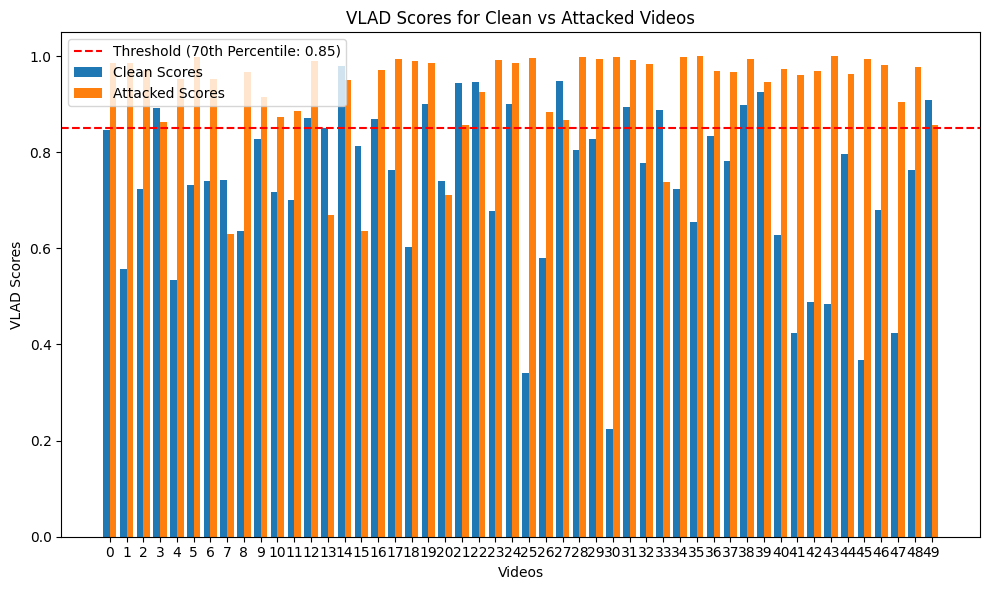

In [ ]:
x = np.arange(len(scores_clean_hell_mvit_ucf))
width = 0.4
video_names = list(range(1, 21))


fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width/2, scores_clean_hell_mvit_ucf, width, label='Clean Scores')
ax.bar(x + width/2, scores_attacked_hell_mvit_ucf, width, label='Attacked Scores')
ax.axhline(y=threshold_hell, color='red', linestyle='--', label=f'Threshold ({theta}th Percentile: {threshold_hell:.2f})')

# Adding labels and title
ax.set_xlabel('Videos')
ax.set_ylabel('VLAD Scores')
ax.set_title('VLAD Scores for Clean vs Attacked Videos')
ax.set_xticks(x)
# ax.set_xticklabels(video_names)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

In [ ]:
print(scores_clean_kl_mvit_ucf)
print(scores_attacked_kl_mvit_ucf)
print(scores_clean_hell_mvit_ucf)
print(scores_attacked_hell_mvit_ucf)

[9.403900146484375, 2.780052423477173, 3.9646456241607666, 8.249536514282227, 1.5006036758422852, 6.309663772583008, 4.728951454162598, 6.03941011428833, 2.003464698791504, 5.522032737731934, 4.871004104614258, 4.373547554016113, 6.99647331237793, 8.077357292175293, 8.050830841064453, 4.254122257232666, 4.13865327835083, 5.410604953765869, 1.9858289957046509, 16.296123504638672, 46.548763275146484, 20.052310943603516, 25.124666213989258, 2.2280092239379883, 5.136539936065674, 1.6914712190628052, 0.9586889743804932, 6.596496105194092, 3.502457618713379, 5.088049411773682, 0.28594261407852173, 5.665023326873779, 3.0016655921936035, 4.62539529800415, 3.419769763946533, 2.28352427482605, 12.2760009765625, 3.034386396408081, 7.378405570983887, 16.190664291381836, 4.276723861694336, 2.2077903747558594, 4.258447170257568, 3.7103562355041504, 5.200535774230957, 1.9115989208221436, 4.237378120422363, 4.607095718383789, 5.217768669128418, 6.115691184997559]
[13.477707862854004, 22.46757125854492

In [ ]:
import csv

combined_data = zip(scores_clean_kl_mvit_ucf, scores_attacked_kl_mvit_ucf, scores_clean_hell_mvit_ucf, scores_attacked_hell_mvit_ucf)

output_path = "../mvit_ucf_data.csv"

with open(output_path, mode='w', newline='') as file:
    writer = csv.writer(file)

    writer.writerow(["kl_clean", "kl_attacked", "hell_clean", "hell_attacked"])

    writer.writerows(combined_data)

print(f"Data saved to {output_path}")


Data saved to ../mvit_ucf_data.csv
